<a href="https://colab.research.google.com/github/Rogerio-mack/work/blob/main/Aneur_explore_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
!pip install pydicom


In [45]:
!pip install gdown

In [46]:
!gdown 1kV282Uyb_k48DqNVJQHClBKIicfn9hSG

!unzip *.zip > /dev/null

Downloading...
From (original): https://drive.google.com/uc?id=1kV282Uyb_k48DqNVJQHClBKIicfn9hSG
From (redirected): https://drive.google.com/uc?id=1kV282Uyb_k48DqNVJQHClBKIicfn9hSG&confirm=t&uuid=af642ac8-1243-4713-9fbd-37a73e1848db
To: /content/casos_BP_02_03_04.zip
100% 344M/344M [00:08<00:00, 41.1MB/s]
replace casos_BP_02_03_04/1. BP01 - BP200 - Laudos.xlsx? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace casos_BP_02_03_04/2. AAA Exames IA.xlsx? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
A


In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import pydicom
import os

# Tabela de dados

In [48]:

input_dir = '/content/casos_BP_02_03_04/'

#-------------------------------------------------------------------------------

df = pd.read_excel(input_dir + '1. BP01 - BP200 - Laudos.xlsx')
df[ df['ID Pesquisa'].isin(['BP2','BP3','BP4']) ]

,ID Pesquisa,NR_PRONT,DT_NASC,IDADE,NR_ATEND,PRESCRICAO,EXAME,DS_LAUDO,EXAME 0 Normal 1 Aneurisma 2 outras doenças,Download do exame
1,BP2,3345354,21/12/1983,33,9519154,2017-02-01 18:01:43,Ressonância Magnética Angio Intracraniana Arte...,ANGIO-RM INTRACRANIANA ARTERIAL\nTécnica de Ex...,0.0,ok
2,BP3,1391335,1970-08-09 00:00:00,46,9520234,2017-03-01 10:01:12,Ressonância Magnética Angio Intracraniana Arte...,ANGIO-RM INTRACRANIANA ARTERIAL\nTécnica de Ex...,1.0,ok
3,BP4,666477,24/04/1934,82,9519272,2017-04-01 11:01:28,Ressonância Magnética Angio Intracraniana Arte...,RESSONÂNCIA MAGNÉTICA DO ENCÉFALO E ANGIORRESS...,2.0,ok


In [49]:

caso = 'BP02- 3345354'
input_dir = input_dir + caso + '/'

#-------------------------------------------------------------------------------
dcm_count = sum(1 for filename in os.listdir(input_dir) if filename.endswith('.dcm'))

print(f"Number of *.dcm files in {input_dir}: {dcm_count}")

Number of *.dcm files in /content/casos_BP_02_03_04/BP02- 3345354/: 284


# Exibe uma imagem selecionada

Arquivo: IM-0001-0020.dcm
Paciente: ANONYMOUS_MR_1183352547
ID do Estudo: 


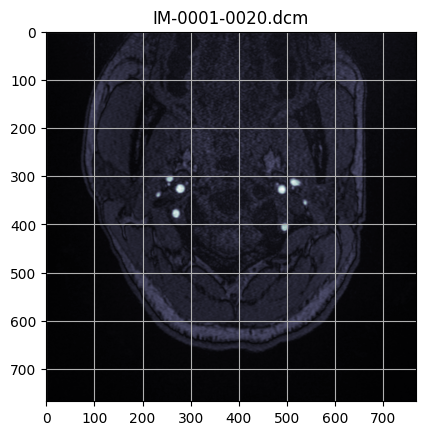

In [51]:

filename = 'IM-0001-0020.dcm'

#-------------------------------------------------------------------------------

filepath = os.path.join(input_dir, filename)
ds = pydicom.dcmread(filepath)

# Exibe informações básicas do arquivo DICOM
print(f"Arquivo: {filename}")
print(f"Paciente: {ds.PatientName}")
print(f"ID do Estudo: {ds.StudyID}")
# ... outras informações relevantes ...

# Exibe a imagem usando matplotlib
plt.imshow(ds.pixel_array, cmap=plt.cm.bone)
plt.title(filename)

plt.grid()
plt.show()



# Exibe um range ou uma lista de imagens selecionadas

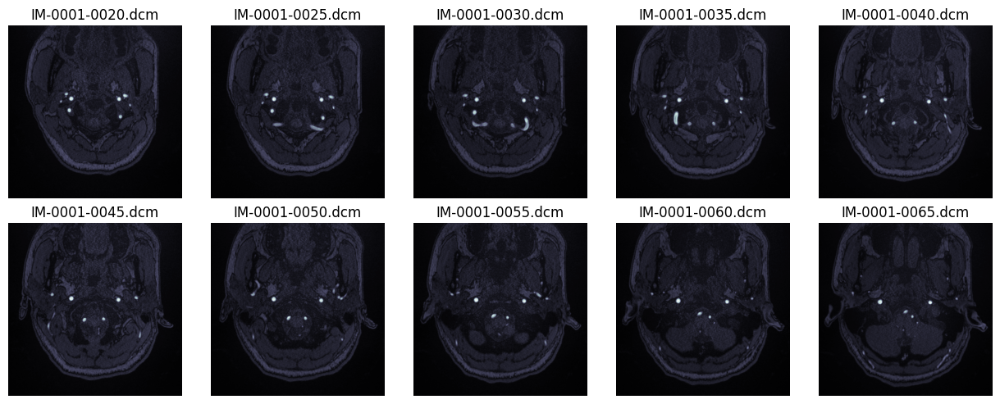

In [52]:
# a fixed list
# list_images = [f"{x:04d}" for x in np.array([1, 20, 132])]

# a range by step
start = 20; end =  70; step = 5;
list_images = [f"{x:04d}" for x in np.arange(start, end, step)]

n_cols = 5
size_image = 2.5
#-------------------------------------------------------------------------------

n_rows = len(list_images)//n_cols
if len(list_images)%n_cols != 0:
  n_rows = n_rows + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*size_image, n_rows*size_image))

for i, file_nr in enumerate(list_images):

  filename = f"IM-0001-{file_nr}.dcm"
  filepath = os.path.join(input_dir, filename)

  try:
    ds = pydicom.dcmread(filepath)
    row = i // n_cols
    col = i % n_cols
    axes[row, col].imshow(ds.pixel_array, cmap=plt.cm.bone)
    axes[row, col].set_title(filename)
    axes[row, col].axis('off')

  except Exception as e:
    print(f"Erro ao processar o arquivo {filename}: {e}")
    row = i // n_cols
    col = i % n_cols
    axes[row, col].axis('off')


plt.tight_layout()
plt.show()


# Exibe todas as imagens no diretório

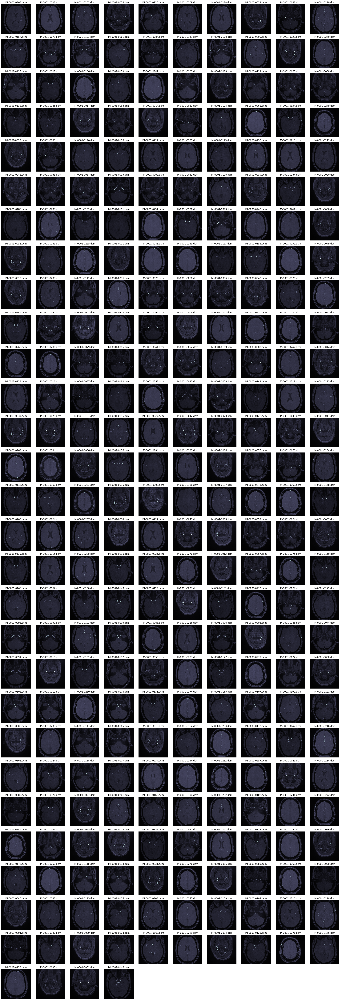

In [59]:

n_cols = 10
image_size = 1.8

#-------------------------------------------------------------------------------
n_rows = dcm_count//n_cols
if dcm_count%n_cols != 0:
  n_rows = n_rows + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*size_image, n_rows*size_image))
plt.subplots_adjust(wspace=0.05, hspace=0.05)
i = 0

# Verifica se o diretório /content existe
if os.path.exists(input_dir):
  # Lista todos os arquivos no diretório /content
  for filename in os.listdir(input_dir):
    if filename.endswith('.dcm'):
      filepath = os.path.join(input_dir, filename)
      try:
        ds = pydicom.dcmread(filepath)
        row = i // n_cols
        col = i % n_cols
        axes[row, col].imshow(ds.pixel_array, cmap=plt.cm.bone)
        axes[row, col].set_title(filename)
        axes[row, col].axis('off')
        i = i + 1

      except Exception as e:
        print(f"Erro ao processar o arquivo {filename}: {e}")

  if i < n_rows*n_cols:
    for row in range(n_rows):
      for col in range(n_cols):
        if i >= n_rows*n_cols:
          break
        axes[row, col].axis('off')

  plt.tight_layout()
  plt.show()
else:
  print(f"O diretório {input_dir} não existe.")